# Preparation


In [ ]:
import sys

sys.path.append("../..")

## Import


In [ ]:
from updpc import *

In [3]:
import pandas as pd
from tqdm.notebook import tqdm

## Set System Parameters


In [4]:
# 333x params
na_in = 0.328
w_in = 0.074
na_cos = 1.295
# na_ill = 1.33
na_ill = 0.55
na_in = 0.5

In [5]:
wavelength = 0.445  # in micron
mag, na = 1000 / 3, 1.4
pixel_size_cam = 3.45  # pixel size of camera in micron
pixel_size = pixel_size_cam / mag * 2  # in micron
source_pols = [[90, 45], [-45, 0]]
a0 = 1
wavelength_pix = wavelength / pixel_size
shear_ZPC = 0.05 # um
bias_ZPC = pi/4

In [6]:
pixel_y, pixel_x = 1000, 1000

# Siemens Star


<Axes: title={'center': 'Transmission'}>

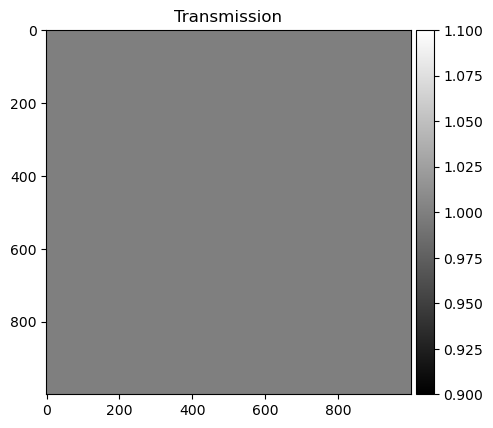

In [7]:
absorption_orig = np.zeros((pixel_y, pixel_x))
trans = np.exp(absorption_orig)
imshow(trans, title="Transmission", figsize=(5, 5))

- Good depth 50 nm
- Minimum width 50 nm


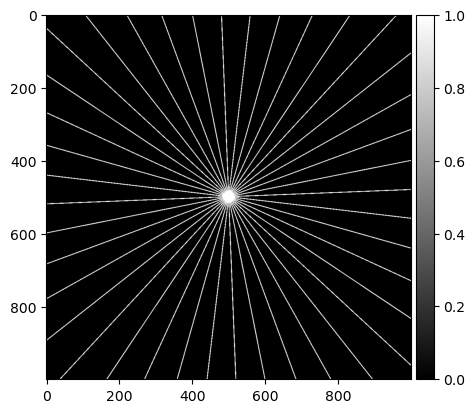

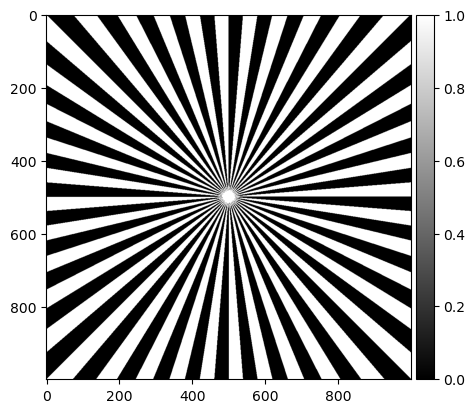

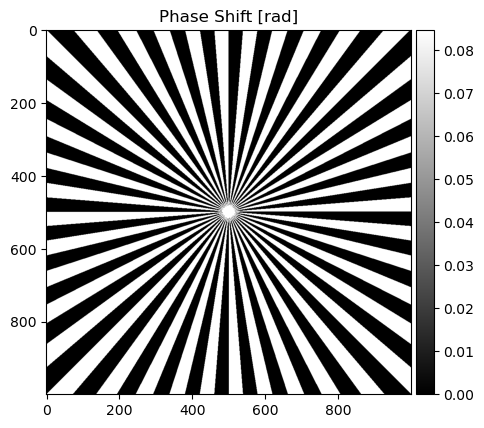

In [8]:
ri_glass = 1.45
ri_medium = 1.33
rad_um = 30
h_um = 0.05
w_um = 0.05

w_pixel_2 = w_um / pixel_size / 2
xlin = range(pixel_x)
ylin = range(pixel_y)
xgrid, ygrid = np.meshgrid(xlin, ylin)
xgrid = xgrid - pixel_x / 2
ygrid = ygrid - pixel_y / 2

star = ((np.arctan2(ygrid, xgrid) / pi + 1) * 40).astype(int) % 2
disk = (xgrid**2 + ygrid**2) * pixel_size**2 <= rad_um**2
star_rect = np.zeros_like(star)
for i in range(20):
    theta = pi / 80 * (4 * i + 3)
    star_rect += np.abs(ygrid * np.cos(theta) - xgrid * np.sin(theta)) < w_pixel_2
imshow(star_rect > 0, (5, 5))
shadow = ((star + star_rect) > 0) * disk
imshow(shadow, (5, 5))
phase_const = 2 * pi * (ri_glass - ri_medium) * h_um / wavelength
phase_orig = phase_const * shadow

# # imshow(height_orig * 1000, (5, 5), title="Carving depth [um]")
# # imshow(phase_orig_lambda, (5, 5), title="Phase shift [$\lambda$]")
imshow(phase_orig, (5, 5), title="Phase Shift [rad]")
plt.show()

<Axes: title={'center': 'Benchmark Tech.'}>

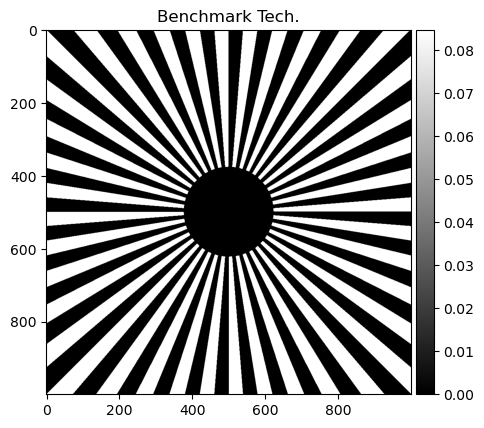

In [9]:
benchmark_rad = 400 / 1000 * 40 / 2 / pi / pixel_size
imshow(
    phase_orig * (xgrid**2 + ygrid**2 > benchmark_rad**2),
    (5, 5),
    title="Benchmark Tech.",
)

<Axes: title={'center': 'Maded by Yamamoto'}>

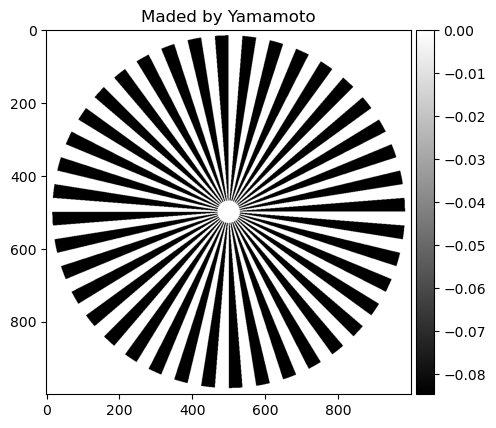

In [10]:
yamamoto_rad = 100 / 1000 * 40 / 2 / pi / pixel_size
r2grid = xgrid**2 + ygrid**2
phase_orig = -phase_orig * (yamamoto_rad**2 < r2grid) * (r2grid < (10 / pixel_size)**2)
imshow(
    phase_orig,
    (5, 5),
    title="Maded by Yamamoto",
)

In [11]:
class ZPCSolver(UpDPCSolver):
    def __init__(
        self,
        dpc_imgs,
        wavelength,
        na,
        na_in,
        pixel_size,
        source_pols,
        na_ill=None,
        na_cos=np.inf,
        w_in=0,
        a0=1,
    ):
        super().__init__(
            dpc_imgs,
            wavelength,
            na,
            na_in,
            pixel_size,
            source_pols,
            na_ill,
            na_cos,
            w_in,
            a0,
        )
        self.pupil = self.pupil + (-0.9 + 1j) * pupilGen(
            self.fxlin, self.fylin, self.wavelength, self.na_ill, self.na_in
        )
        self.WOTFGen()

    def sourceGen(self):
        self.source = [
            cosSourceGen(
                self.fxlin, self.fylin, self.wavelength, self.na_ill, self.na_cos
            )
            * pupilGen(self.fxlin, self.fylin, self.wavelength, self.na_ill, self.na_in)
        ]
        self.source = np.asarray(self.source)


    def IfromPhaseAbs(self, phase, absorption):
        return np.array(
            [
                self.a0**2
                * (Hu_i[0, 0] / 2 + (IF(Hu_i * F(absorption) + Hp_i * F(phase))))
                for Hu_i, Hp_i in zip(self.Hu, self.Hp)
            ]
        ).real

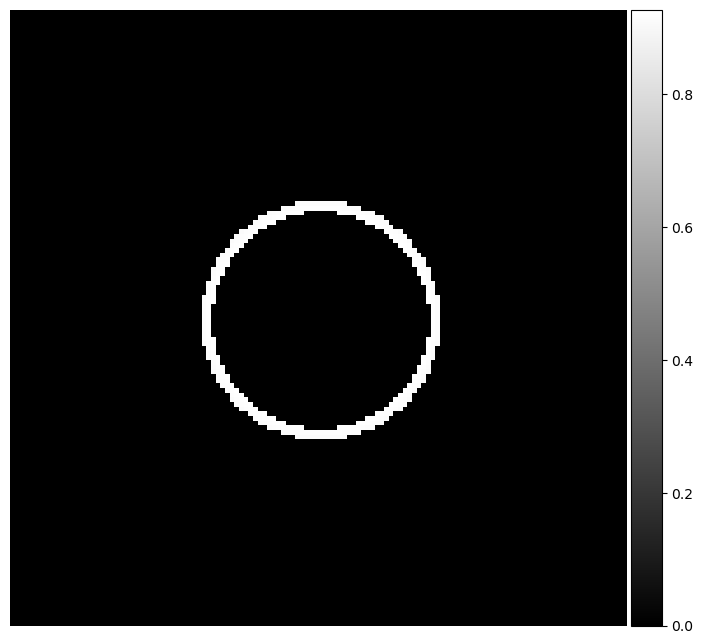

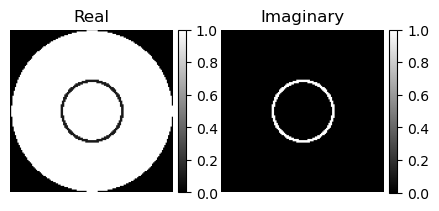

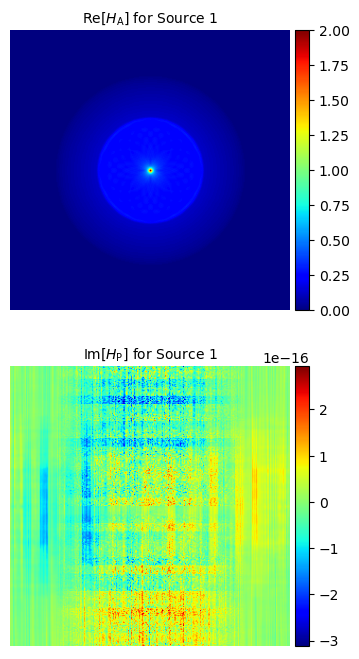

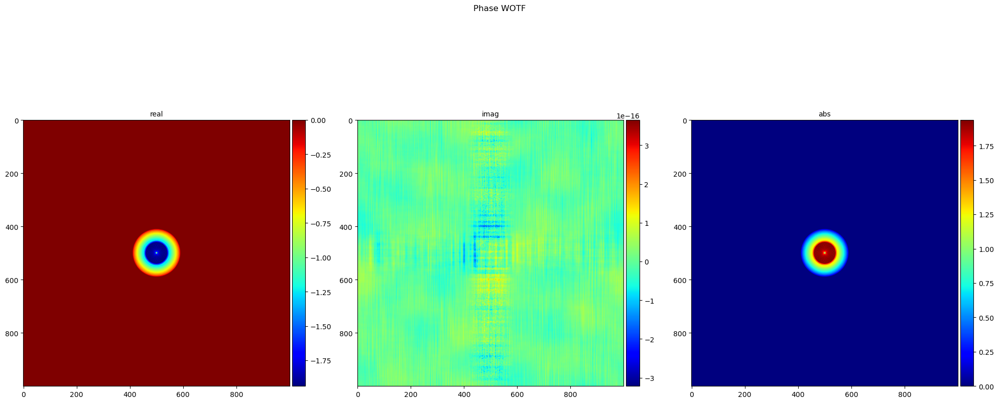

In [12]:
solver = ZPCSolver(
    np.array([phase_orig]),
    wavelength,
    na,
    na_in,
    pixel_size,
    source_pols,
    na_ill,
    na_cos,
    w_in,
    a0,
)
solver.plot_source()
solver.plot_pupil()
solver.plot_wotf()
imimshow(fftshift(solver.Hp[0]), cmap="jet", title="Phase WOTF")
ZPC_images = solver.IfromPhaseAbs(phase_orig, absorption_orig)

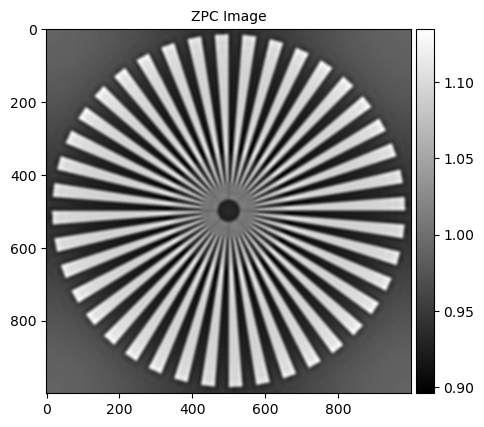

In [13]:
ZPC_image = ZPC_images[0]
imshow(ZPC_image, (5, 5), title="ZPC Image")
imwrite_f32(join("..", "data", "simulation", f"ZPC_Mag{mag:.0f}_NA{na}_NAill{na_ill}_NAin{na_in}_NAcos{na_cos}_lambda{int(wavelength*1000)}_Phase{phase_const:.2f}.tif"), ZPC_image, pixel_size_um=pixel_size)

In [14]:
ylabel = "Intensity"

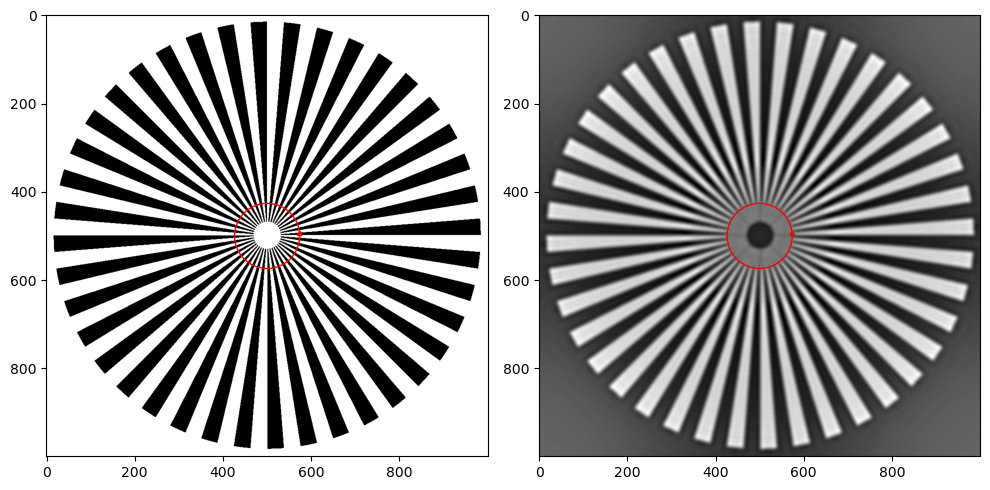

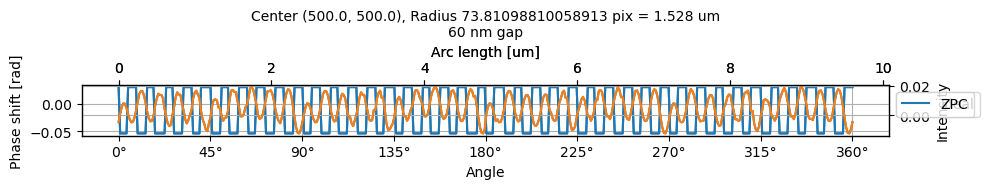

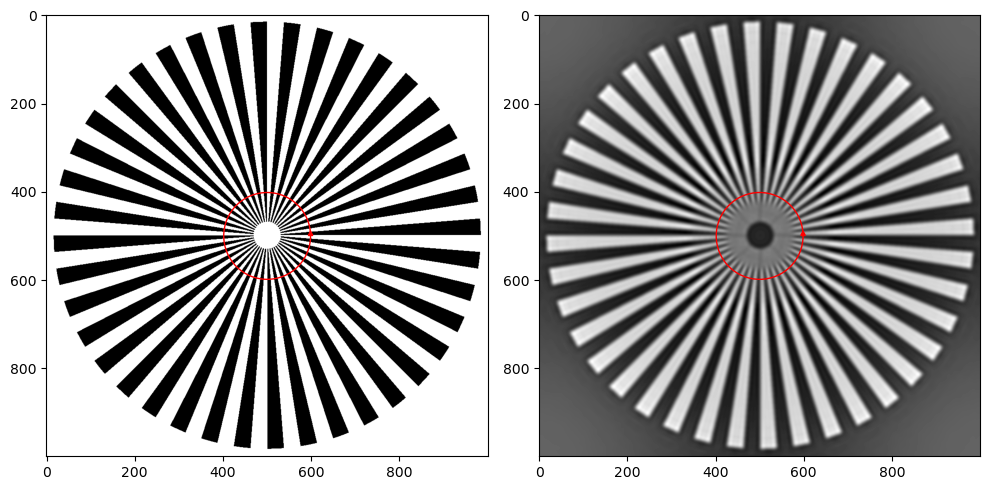

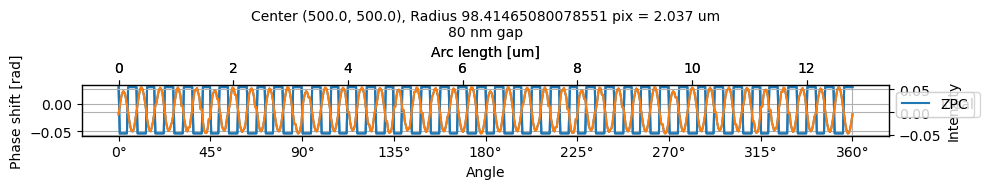

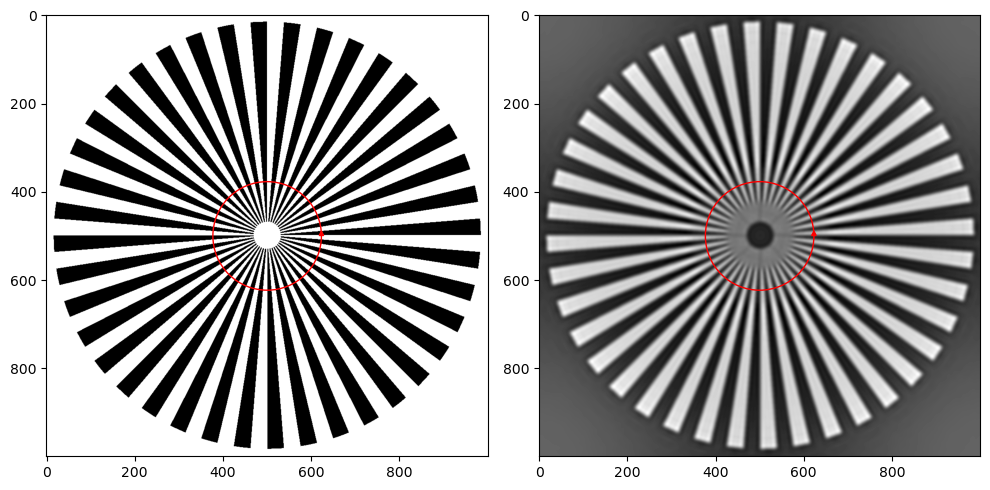

...

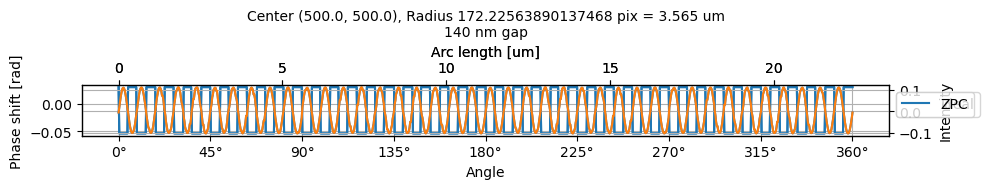

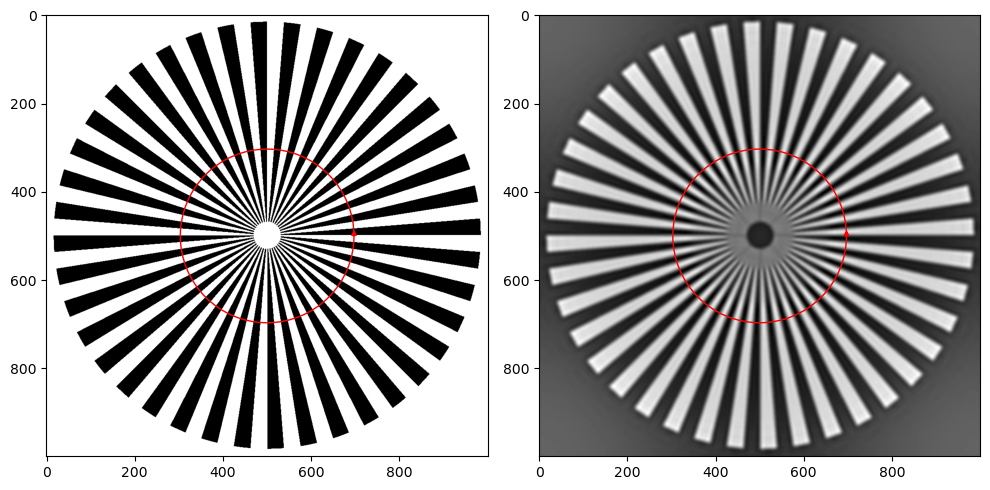

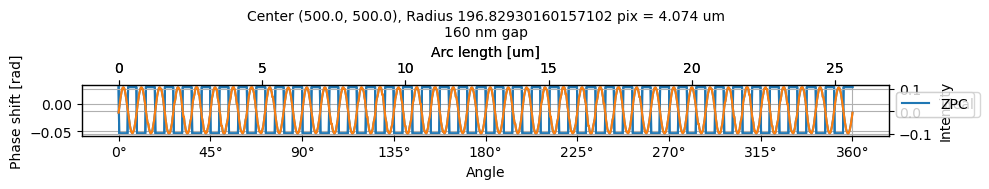

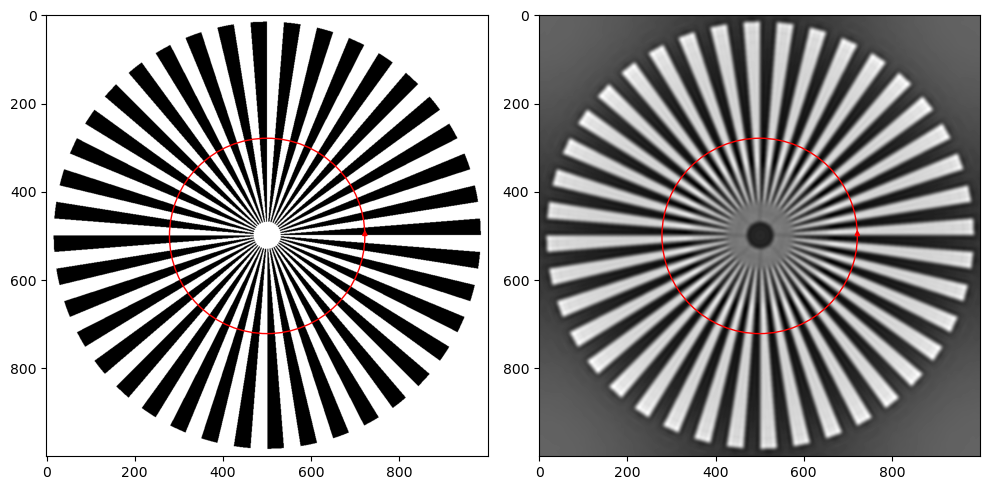

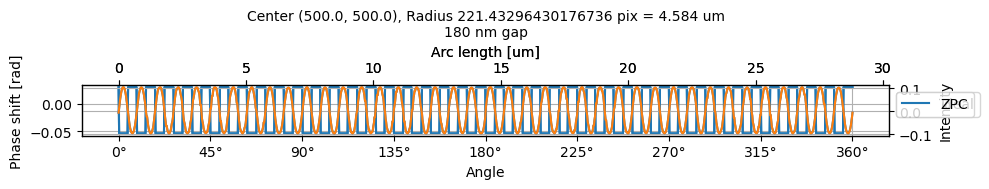

In [15]:
for gap_nm in np.arange(60, 200, 20):
    rad = gap_nm / 1000 * 80 / pixel_size / 2 / pi
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig2, ax2 = plt.subplots(figsize=(10, 2))
    phase_pred = ZPC_image.copy()
    plot_intensity_on_circle(
        phase_orig - phase_orig.mean(),
        pixel_y / 2,
        pixel_x / 2,
        rad * 2,
        pixel_size,
        ylabel, axes[0],
        ax2,
        label="Ideal",
    )
    plot_intensity_on_circle(
        phase_pred - phase_pred.mean(),
        pixel_y / 2,
        pixel_x / 2,
        rad * 2,
        pixel_size,
        ylabel, axes[1],
        ax2.twinx(),
        label="ZPC",
        color="C1",
    )
    fig.tight_layout()
    fig2.tight_layout()
    ax2.set_ylabel("Phase shift [rad]")
    ax2.set_title(f"{gap_nm} nm gap")
    plt.show()

### MTF

In [16]:
phi0 = 1

def plot_MTF(
    img,
    cy,
    cx,
    pixel_size=pixel_size,
    ax=None,
    label=None,
    angle_point_num=None,
    rad_min=int(0.5 / pixel_size),
    rad_max=int(10 / pixel_size),
    **kwargs,
):
    rads = range(rad_min, rad_max)
    us = []
    mtfs = []
    for rad in tqdm(rads):
        u = 1 / rad * 40 / (2 * pi) / pixel_size
        us.append(u)
        theta, intensity = intensity_on_circle(
            img, cy, cx, rad, ax, angle_point_num, show_image=False
        )
        us_ = fftfreq(len(theta), (theta[1] - theta[0]) * rad * pixel_size)
        u_match = np.argmin(np.abs(us_ - u))
        mtfs.append(np.abs(F1(intensity)[u_match]) / len(intensity))

    mtfs = np.array(mtfs) / phi0 * pi
    # mtfs = (
    #     np.array(mtfs) / np.array(mtfs).max()
    # )  # No theoretical value --> Normalize with Max
    # # Plot the intensity values on the circle
    # if ax is None:
    #     _, ax = plt.subplots(figsize=(10, 2))

    # ax.plot(us, mtfs, label=label, **kwargs)
    # ax.set_xlabel("Spatial frequency [/um]")
    # ax.set_ylabel("MTF$_\phi$")
    # if label is not None:
    #     ax.legend(loc="upper left", bbox_to_anchor=(1, 1))
    return np.array(us), mtfs



  0%|          | 0/459 [00:00<?, ?it/s]

\\yolab-disk\share\MachineLearning\Inutsuka\code\UpDPC\notebooks\..\updpc\analysis_utils.py:465: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 10))


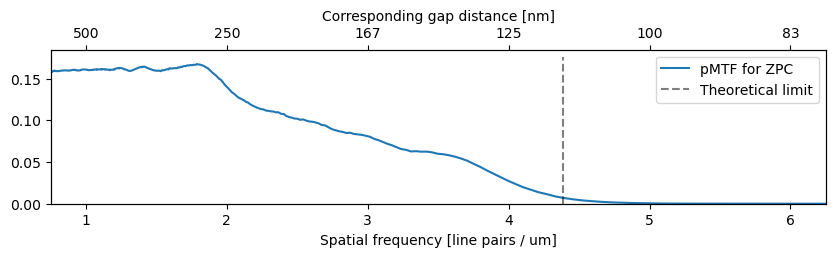

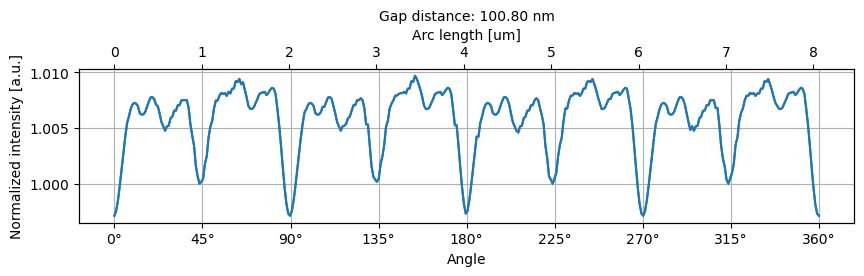

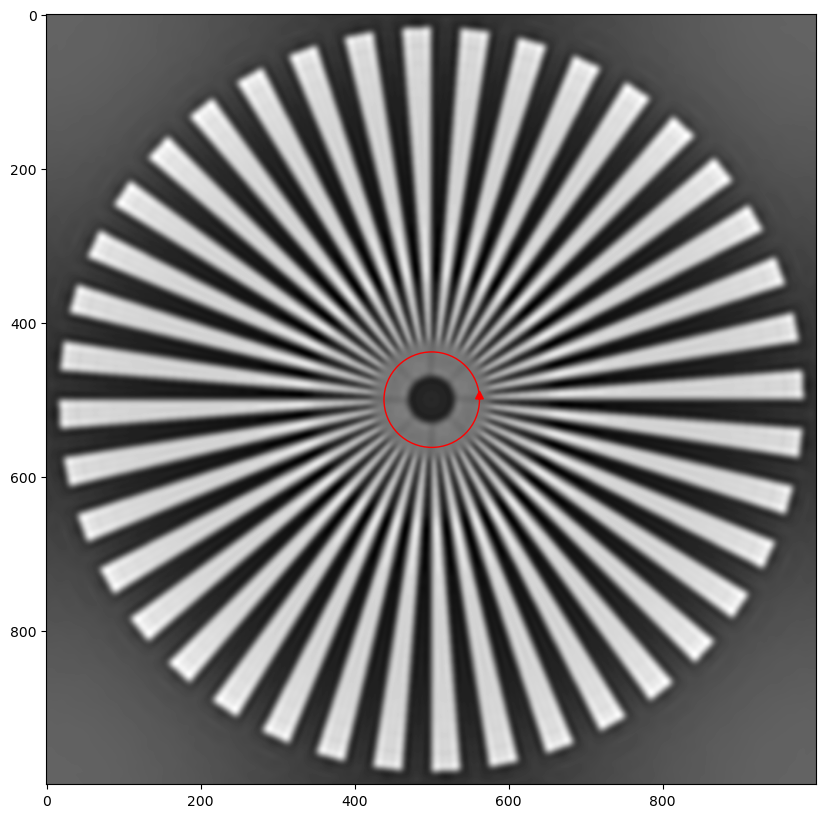

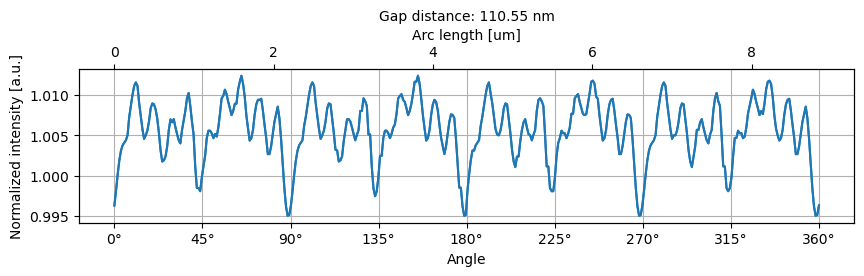

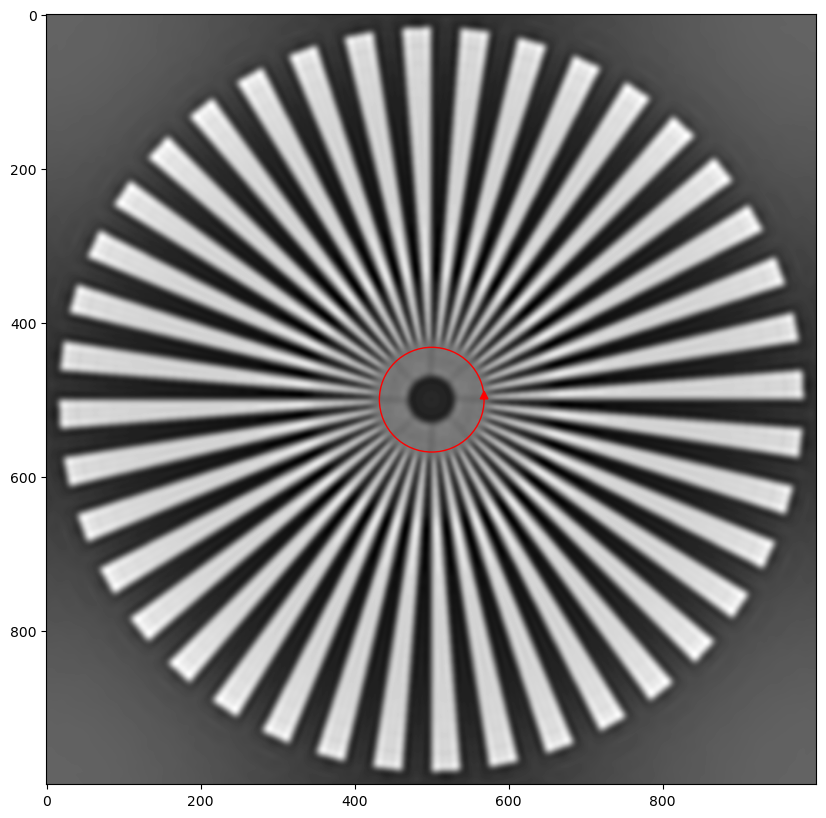

...

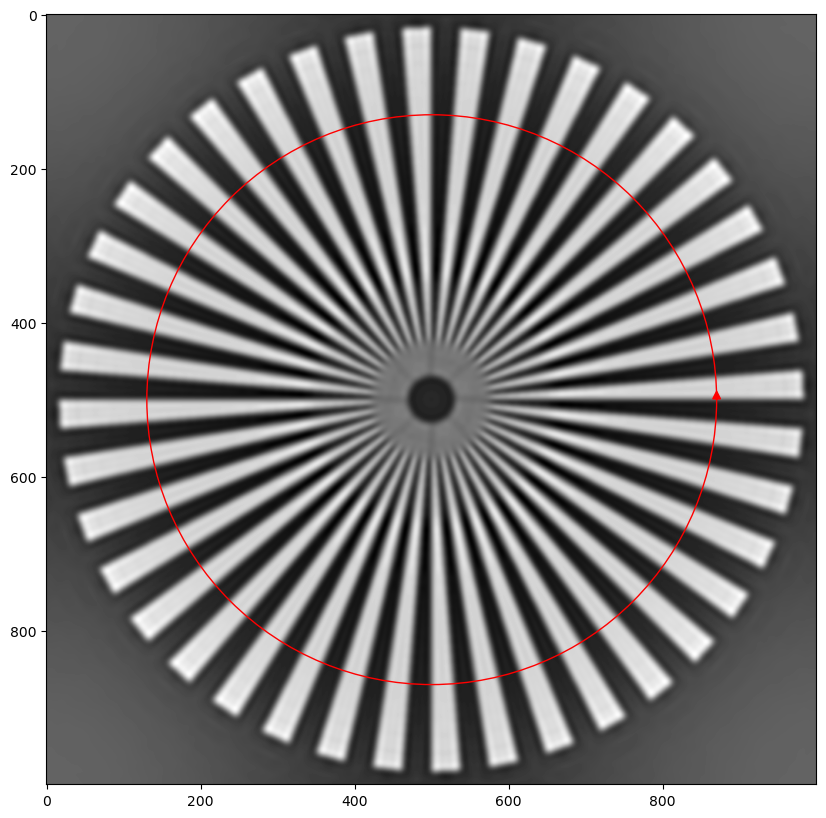

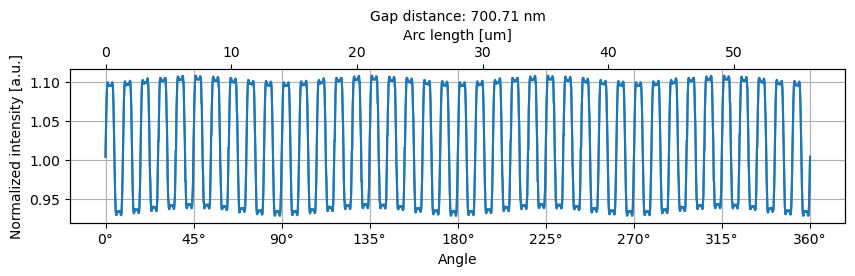

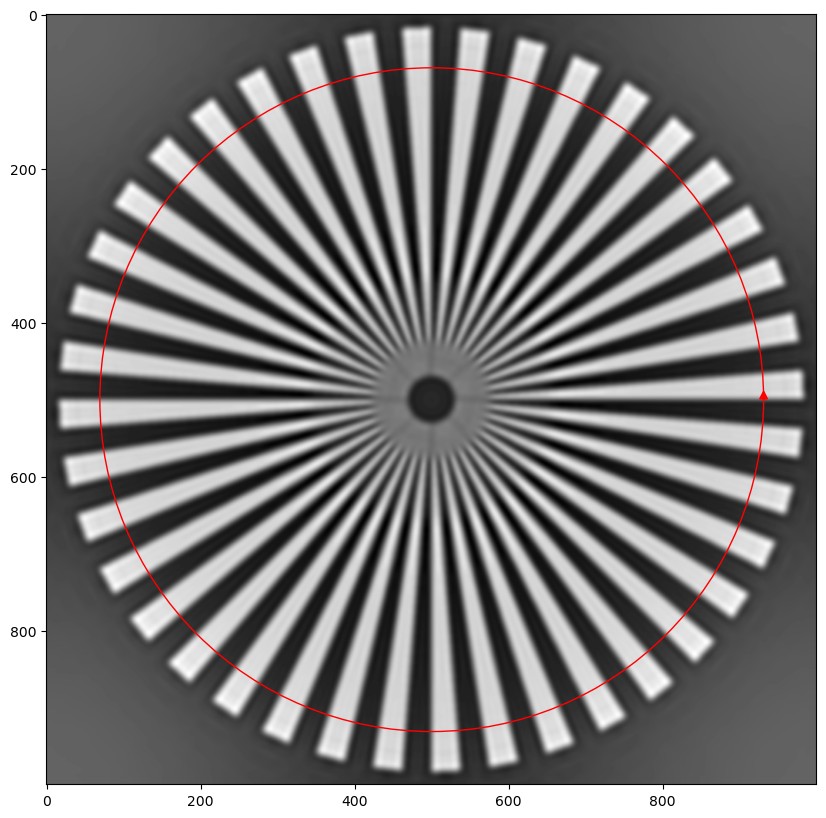

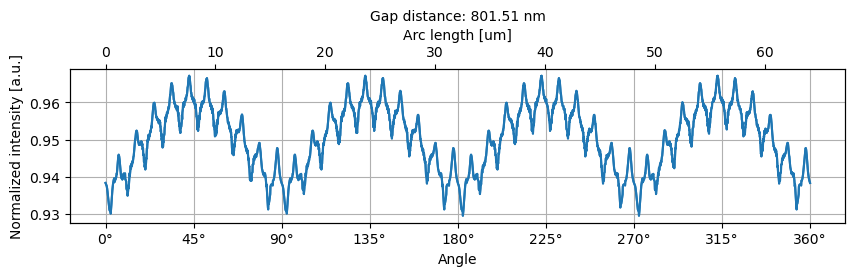

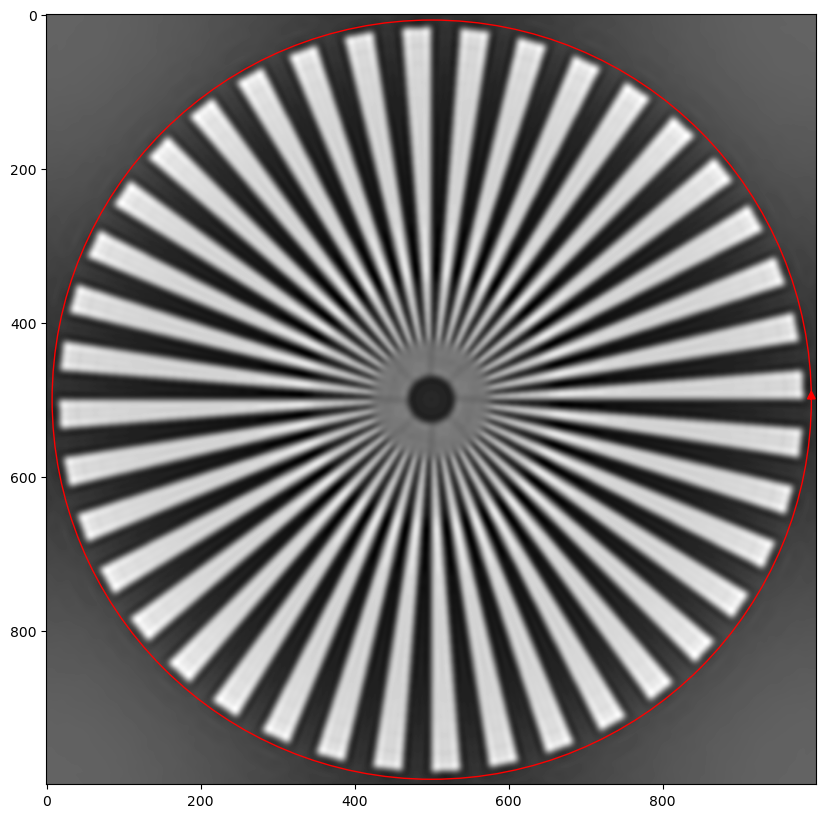

In [17]:
### ANCHOR Single image
center_pred = (pixel_y / 2, pixel_x / 2)
img = ZPC_image
us, mtfs = plot_MTF(img, *center_pred)
type = "ZPC"

#### ANCHOR Theoritical limit
xlim = (0.75, 6.25)
ylim = (0, 1.1)
fig, ax = plt.subplots(figsize=(10, 2))

MTFlabel = f"pMTF for {type}"
phaselabel = "Normalized intensity [a.u.]"
ax.plot(us, mtfs, label=MTFlabel, alpha=1)

cutoff = (na_ill + na) / wavelength
ax.vlines(
    cutoff,
    0,
    ax.get_ylim()[1],
    color="black",
    linestyle="--",
    alpha=0.5,
    label="Theoretical limit",
)

ax.set_xlim(*xlim)
# ax.set_ylim(*ylim)
ax.set_ylim(ylim[0])
ax.legend()

ax.set_xlabel("Spatial frequency [line pairs / um]")

ax2 = ax.twiny()
ax2.set_xlim(*xlim)
# ax2.set_ylim(*ylim)
ax2.set_ylim(ylim[0])
current_ticks = plt.xticks()[0]
current_ticks = current_ticks[
    (xlim[0] < current_ticks) & (current_ticks < xlim[1])
]
tick_labels = [
    f"{round(500/tick)}" if tick != 0 else "0" for tick in current_ticks
]
# ax2.set_xticks(current_ticks, tick_labels)
ax2.set_xticks(current_ticks)
ax2.set_xticklabels(tick_labels)
ax2.set_xlabel("Corresponding gap distance [nm]")

# ax.legend(loc="center left")
for gap_um in np.append(np.arange(0.1, 0.2, 0.01), np.arange(0.2, 0.9, 0.1)):
    rad_pix = int(80 * gap_um / 2 / pi / pixel_size) + 1
    fig, ax = plt.subplots(figsize=(10, 2))
    try:
        plot_intensity_on_circle(
            img, *center_pred, rad_pix, pixel_size, ylabel=phaselabel, ax=ax
        )
        ax.set_title(
            f"Gap distance: {2 * pi * rad_pix * pixel_size / 80 * 1000:.2f} nm"
        )
    except Exception as e:
        print(e)
        # imshow(img, title=basename(clean_path), figsize=(3, 3))
        # plt.show()
        pass
